In [ ]:
!pip install statsmodels

In [ ]:
!pip install wquantiles

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import trim_mean
from statsmodels import robust
import wquantiles
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df=pd.read_excel("/content/CENSO POBLACIONAL AGOSTO.xlsx")

In [ ]:
df.columns


Index(['cod_dpto', 'Departamento', 'cod_mpio', 'Municipio', 'fec_paquete',
       'num_paquete', 'num_ficha', 'ide_ficha_origen', 'ide_edificacion',
       'ver_estructura',
       ...
       'ide_Ug', 'persug', 'Capital', 'marca', 'estado', 'Linea_p',
       'replicacion', 'fec_actualizacion_cns', 'C', 'Clasificacion'],
      dtype='object', length=255)

In [ ]:
# Columnas GPS que queremos conservar
columnas_gps = [
    'Coord_x_manual_rec', 'Coord_y_manual_rec',
    'Coord_x_auto_rec', 'Coord_y_auto_rec',
    'Coord_x_manual_enc', 'Coord_y_manual_enc',
    'Coord_x_auto_enc', 'Coord_y_auto_enc',
    'Gps_Alt_auto_rec', 'Gps_Alt_auto_enc'
]

# Columnas que eliminaremos
columnas_a_eliminar = [
    'cod_dpto', 'Departamento', 'cod_mpio', 'Municipio', 'fec_paquete',
    'num_paquete', 'ide_ficha_origen', 'ver_estructura', 'ori_encuesta',
    'Cod_clase', 'Cod_centro_poblado', 'Cod_area_coordinacion', 'Cod_area_operativa',
    'Cod_uni_cobertura', 'Cod_comuna', 'Cod_corregimiento', 'NOM_CORREGIMIENTO',
    'Cod_vereda', 'NOM_VEREDA', 'Cod_barrio', 'NOM_BARRIO', 'Cod_enumerador',
    'fec_ini_encuesta', 'fec_fin_encuesta', 'Fec_captura_gps_rec',
    'Gps_Distancia_rec', 'Gps_Distancia_enc', 'Cod_digitador', 'Fec_digitacion',
    'Cod_Chip', 'Dir_Chip', 'Cod_UC_total', 'fec_actualizacion_cns',
    'estado', 'marca', 'Linea_p', 'replicacion'
]

# Eliminar columnas
df_limpio = df.drop(columns=columnas_a_eliminar)

# Guardar archivo limpio
df_limpio.to_excel("CENSO_LIMPIO_CON_GPS.xlsx", index=False)


In [ ]:
# Calcular el número de valores nulos por columna
nulos_por_columna = df.isnull().sum()

# Filtrar solo las columnas que tienen al menos un valor nulo
columnas_con_nulos = nulos_por_columna[nulos_por_columna > 0]

# Mostrar resultado ordenado
columnas_con_nulos.sort_values(ascending=False)

,0
Cod_Chip,12987
Dir_Chip,12987
Email_contacto,12772
Jefe_UG,8476
fec_ini_visita2,6311
fec_ini_persona1,6221
fec_fin_persona1,6220
seg_nom_informante,6176
seg_nombre,4849
fec_fin_visita2,1181


In [ ]:
categorias = {
    "Identificación geográfica y técnica": [
        'cod_dpto', 'Departamento', 'cod_mpio', 'Municipio', 'Cod_clase',
        'Cod_centro_poblado', 'Cod_area_coordinacion', 'Cod_area_operativa',
        'Cod_uni_cobertura', 'Cod_comuna', 'Cod_corregimiento', 'NOM_CORREGIMIENTO',
        'Cod_vereda', 'NOM_VEREDA', 'Cod_barrio', 'NOM_BARRIO', 'Cod_enumerador'
    ],
    "Datos administrativos y de captura": [
        'fec_paquete', 'num_paquete', 'ide_ficha_origen', 'ver_estructura',
        'ori_encuesta', 'fec_ini_encuesta', 'fec_fin_encuesta', 'Cod_digitador',
        'Fec_digitacion', 'Cod_Chip', 'Dir_Chip', 'Cod_UC_total', 'fec_actualizacion_cns',
        'estado', 'marca', 'Linea_p', 'replicacion'
    ],
    "Coordenadas y localización GPS": [
        'Coord_x_manual_rec', 'Coord_y_manual_rec', 'Coord_x_auto_rec', 'Coord_y_auto_rec',
        'Gps_Alt_auto_rec', 'Fec_captura_gps_rec', 'Gps_Distancia_rec',
        'Coord_x_manual_enc', 'Coord_y_manual_enc', 'Coord_x_auto_enc', 'Coord_y_auto_enc',
        'Gps_Alt_auto_enc', 'Fec_captura_gps_enc', 'Gps_Distancia_enc'
    ]
}


In [ ]:
clasificacion_columnas = {
    categoria: [col for col in columnas if col in df.columns]
    for categoria, columnas in categorias.items()
}


In [ ]:
print(df.columns.tolist())


['cod_dpto', 'Departamento', 'cod_mpio', 'Municipio', 'fec_paquete', 'num_paquete', 'num_ficha', 'ide_ficha_origen', 'ide_edificacion', 'ver_estructura', 'ori_encuesta', 'Cod_clase', 'Cod_centro_poblado', 'Cod_area_coordinacion', 'Cod_area_operativa', 'Cod_uni_cobertura', 'Cod_comuna', 'Cod_corregimiento', 'NOM_CORREGIMIENTO', 'Cod_vereda', 'NOM_VEREDA', 'Cod_barrio', 'NOM_BARRIO', 'Cod_enumerador', 'tot_viviendas', 'tot_hogares', 'ord_vivienda', 'ind_direccion', 'Dir_vivienda', 'uso_vivienda', 'Ide_foto', 'fec_ini_encuesta', 'fec_fin_encuesta', 'Coord_x_manual_rec', 'Coord_y_manual_rec', 'Coord_x_auto_rec', 'Coord_y_auto_rec', 'Gps_Alt_auto_rec', 'Fec_captura_gps_rec', 'Gps_Distancia_rec', 'Coord_x_manual_enc', 'Coord_y_manual_enc', 'Coord_x_auto_enc', 'Coord_y_auto_enc', 'Gps_Alt_auto_enc', 'Fec_captura_gps_enc', 'Gps_Distancia_enc', 'Est_nov_cartografia', 'Cod_digitador', 'Fec_digitacion', 'ind_formato', 'Num_hogares_recuento', 'est_ficha', 'Cod_equipo_encuesta', 'Num_visita', 'Cod_

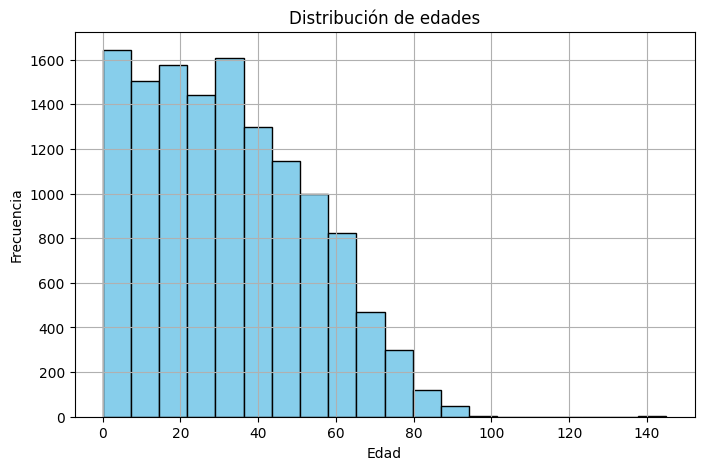

In [ ]:

plt.figure(figsize=(8,5))
df['edad_calculada'].dropna().astype(int).hist(bins=20, color='skyblue', edgecolor='black')
plt.title('Distribución de edades')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


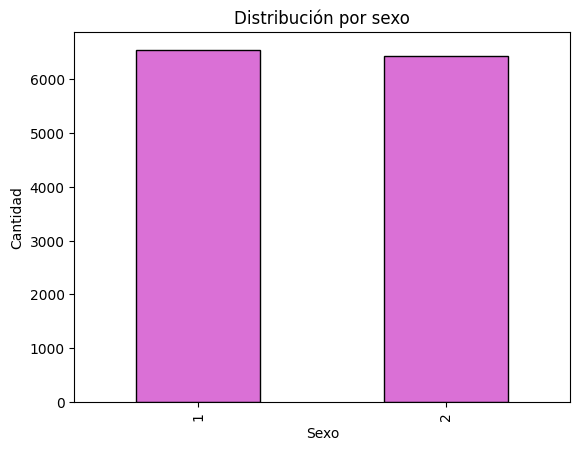

In [ ]:
df['sexo_persona'].value_counts().plot(kind='bar', color='orchid', edgecolor='black')
plt.title('Distribución por sexo')
plt.xlabel('Sexo')
plt.ylabel('Cantidad')
plt.show()


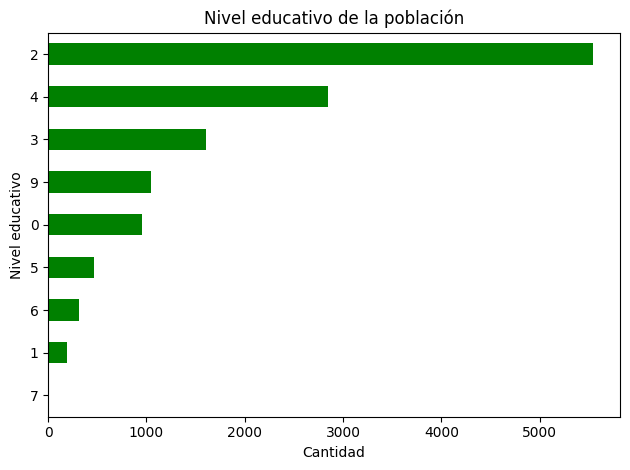

In [ ]:
df['niv_educativo'].value_counts().sort_values().plot(kind='barh', color='green')
plt.title('Nivel educativo de la población')
plt.xlabel('Cantidad')
plt.ylabel('Nivel educativo')
plt.tight_layout()
plt.show()


In [ ]:
survived = df[df['Survived']==1][feature].value_counts()
dead =  df[df['Survived']==0][feature].value_counts()
test = pd.DataFrame([survived,dead])
test.index = ['Sobrevivientes','Fallecidos']
test.plot(kind='bar',stacked=True, figsize=(10,5))

In [ ]:
df['NOM_BARRIO']

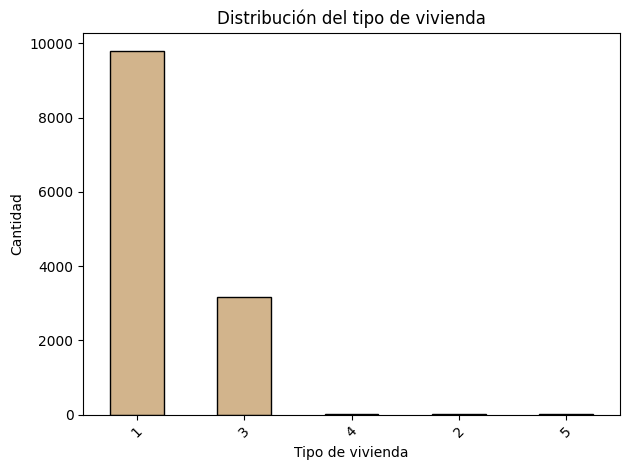

In [ ]:
df['tip_vivienda'].value_counts().plot(kind='bar', color='tan', edgecolor='black')
plt.title('Distribución del tipo de vivienda')
plt.xlabel('Tipo de vivienda')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


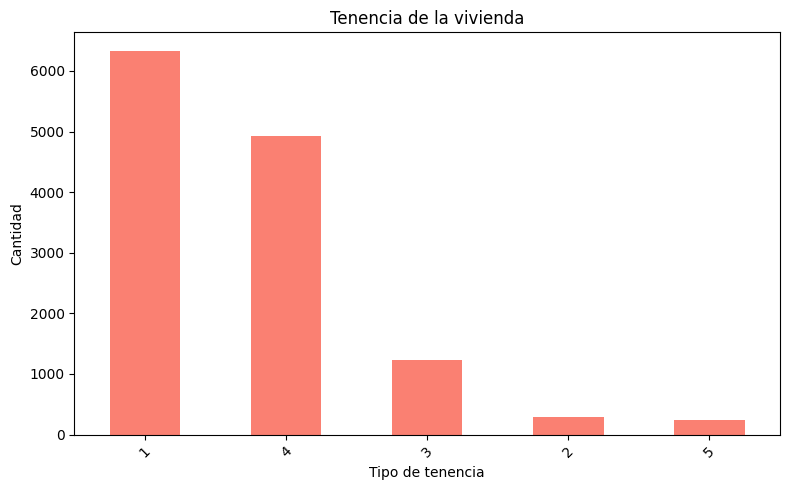

In [ ]:
# 2. Tenencia de la vivienda
plt.figure(figsize=(8, 5))
df['tip_ocupa_vivienda'].value_counts().plot(kind='bar', color='salmon')
plt.title('Tenencia de la vivienda')
plt.xlabel('Tipo de tenencia')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

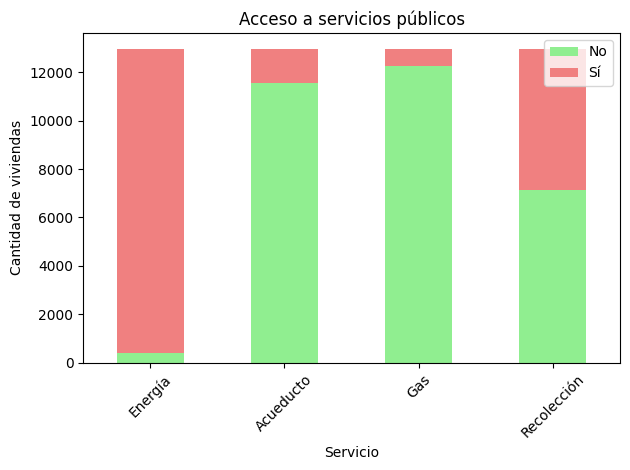

In [ ]:
# 3. Acceso a servicios públicos
servicios = {
    'ind_tiene_energia': 'Energía',
    'ind_tiene_acueducto': 'Acueducto',
    'ind_tiene_gas': 'Gas',
    'ind_tiene_recoleccion': 'Recolección'
}
df_serv = df[list(servicios.keys())].replace({1: 'Sí', 2: 'No'}).rename(columns=servicios)
df_serv.apply(pd.Series.value_counts).T.plot(kind='bar', stacked=True, color=['lightgreen', 'lightcoral'])
plt.title('Acceso a servicios públicos')
plt.xlabel('Servicio')
plt.ylabel('Cantidad de viviendas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

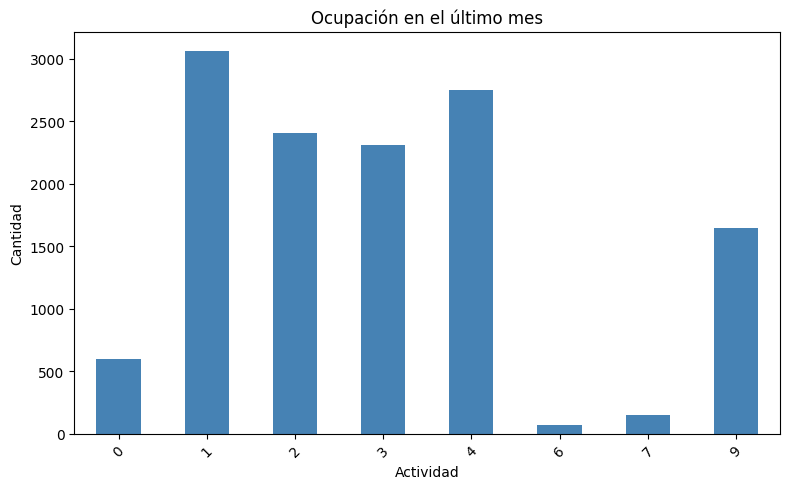

In [ ]:
# Actividad principal en el último mes
plt.figure(figsize=(8, 5))
df['tip_actividad_mes'].value_counts().sort_index().plot(kind='bar', color='steelblue')
plt.title('Ocupación en el último mes')
plt.xlabel('Actividad')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


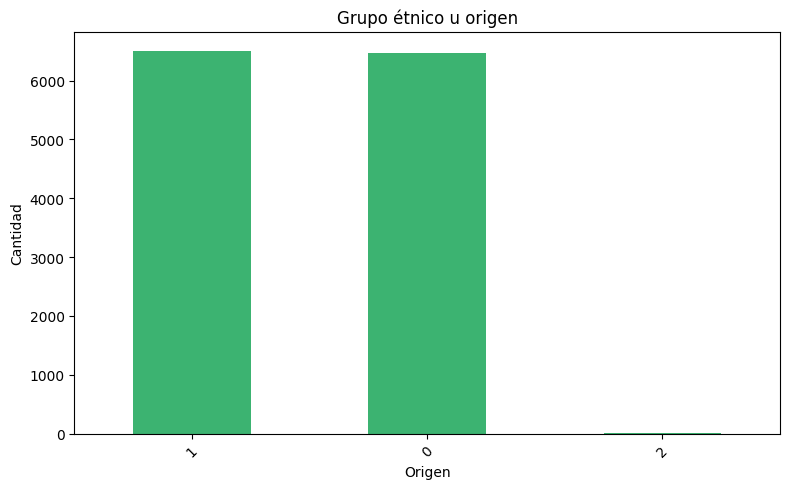

In [ ]:
# Origen étnico
plt.figure(figsize=(8, 5))
df['ori_persona'].value_counts().plot(kind='bar', color='mediumseagreen')
plt.title('Grupo étnico u origen')
plt.xlabel('Origen')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


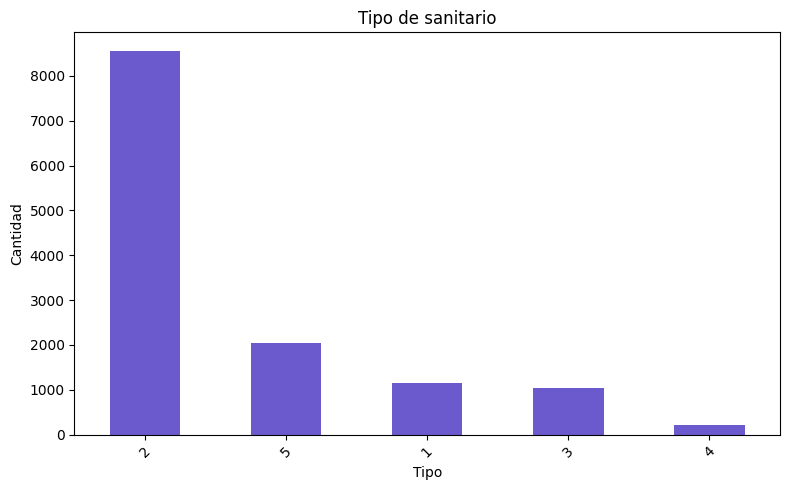

In [ ]:
# Tipo de sanitario
plt.figure(figsize=(8, 5))
df['tip_sanitario'].value_counts().plot(kind='bar', color='slateblue')
plt.title('Tipo de sanitario')
plt.xlabel('Tipo')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


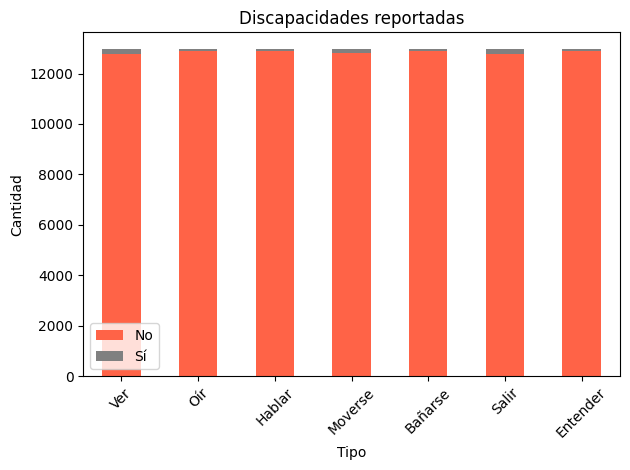

In [ ]:
# Discapacidades
discap = {
    'ind_discap_ver': 'Ver',
    'ind_discap_oir': 'Oír',
    'ind_discap_hablar': 'Hablar',
    'ind_discap_moverse': 'Moverse',
    'ind_discap_bañarse': 'Bañarse',
    'ind_discap_salir': 'Salir',
    'ind_discap_entender': 'Entender'
}

df_discap = df[list(discap.keys())].replace({1: 'Sí', 2: 'No'}).rename(columns=discap)
df_discap.apply(pd.Series.value_counts).T.plot(kind='bar', stacked=True, color=['tomato', 'gray'])
plt.title('Discapacidades reportadas')
plt.xlabel('Tipo')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


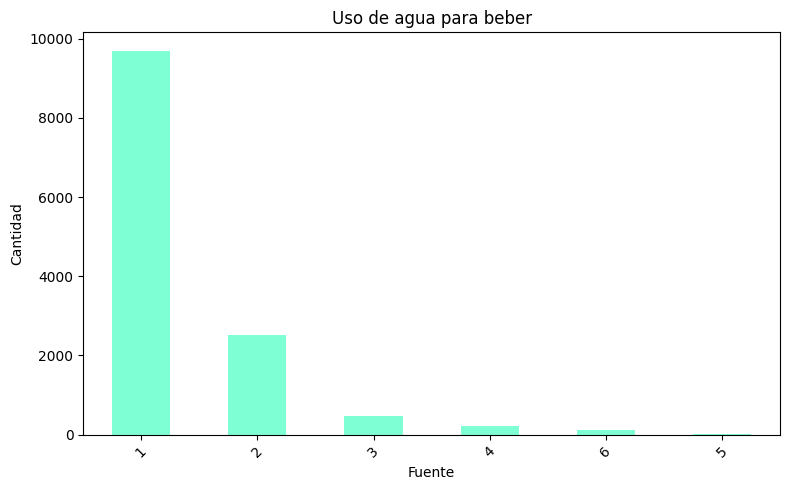

In [ ]:
# Origen del agua de consumo
plt.figure(figsize=(8, 5))
df['tip_uso_agua_beber'].value_counts().plot(kind='bar', color='aquamarine')
plt.title('Uso de agua para beber')
plt.xlabel('Fuente')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

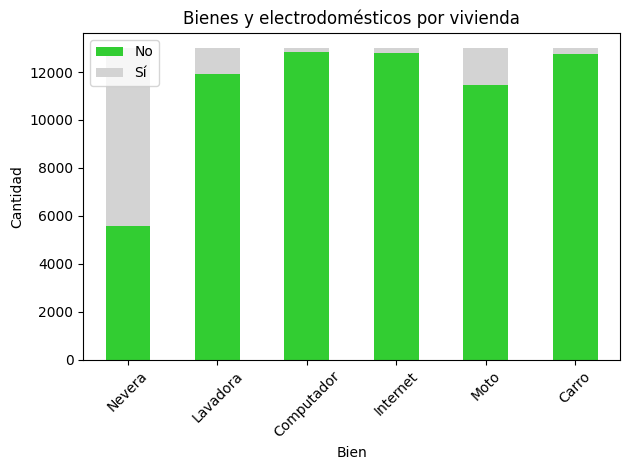

In [ ]:
# Bienes y electrodomésticos
bienes = {
    'ind_tiene_nevera': 'Nevera',
    'ind_tiene_lavadora': 'Lavadora',
    'ind_tiene_pc': 'Computador',
    'ind_tiene_internet': 'Internet',
    'ind_tiene_moto': 'Moto',
    'ind_tiene_carro': 'Carro'
}

df_bienes = df[list(bienes.keys())].replace({1: 'Sí', 2: 'No'}).rename(columns=bienes)
df_bienes.apply(pd.Series.value_counts).T.plot(kind='bar', stacked=True, color=['limegreen', 'lightgray'])
plt.title('Bienes y electrodomésticos por vivienda')
plt.xlabel('Bien')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import folium

# Cargar archivo
df = pd.read_excel("CENSO POBLACIONAL AGOSTO.xlsx", sheet_name="68418-Los_Santos")

# Usamos coordenadas automáticas de encuestador como ejemplo
gps = df[['Coord_y_auto_enc', 'Coord_x_auto_enc']].dropna()

# Crear mapa centrado en el promedio de coordenadas
mapa = folium.Map(
    location=[gps['Coord_y_auto_enc'].mean(), gps['Coord_x_auto_enc'].mean()],
    zoom_start=12
)

# Agregar marcadores
for _, row in gps.iterrows():
    folium.CircleMarker(
        location=[row['Coord_y_auto_enc'], row['Coord_x_auto_enc']],
        radius=2, color='blue', fill=True
    ).add_to(mapa)

mapa
